In [1]:
import os
import re
from typing import List

import faiss
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import requests
import scipy.sparse as sp
import torch
from annoy import AnnoyIndex
from numpy.typing import NDArray
from PIL import Image, UnidentifiedImageError
from sklearn.preprocessing import normalize
from tqdm import tqdm
from transformers import BertModel, BertTokenizerFast

tqdm.pandas()
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [2]:
DATASET_PATH = "data/imdb_movies.parquet"
DATASET_WITH_EMBEDDINGS_PATH = "data/imdb_movies_embeddings.parquet"
SUBMISSION_PATH = "data/submission.parquet"
RELEVANT_TITLES_PATH = "data/relevant_titles_subsample.parquet"
FEATURES_PATH = "data/features.npy"

In [3]:
def clean_text(text: str) -> str:
    """
    Cleans the input text by removing special characters, excess whitespace,
    newlines, and tabs, and converting to lowercase.

    Parameters
    ----------
    text : str
        The input text to be cleaned.

    Returns
    -------
    str
        The cleaned text without special characters and extra whitespace.
    """
    # Replace special characters with a space
    cleaned_text = re.sub(r"[^a-zA-Z0-9\s]", "", text)

    # Remove multiple spaces, newlines, and tabs
    cleaned_text = re.sub(r"\s+", " ", cleaned_text)

    # Convert to lowercase and strip leading/trailing whitespace
    cleaned_text = cleaned_text.lower().strip()

    return cleaned_text


def preprocessing(df: pd.DataFrame, column_name: str) -> pd.DataFrame:
    """
    Cleans a specified column in the DataFrame by removing special characters,
    extra whitespace, newlines, and tabs.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the text data.
    column_name : str
        The column name containing text to be cleaned.

    Returns
    -------
    pd.DataFrame
        A DataFrame with the cleaned text column.
    """

    # Apply the clean_text function to each element in the specified column
    df[column_name] = df[column_name].apply(
        lambda x: clean_text(x) if isinstance(x, str) else x
    )
    return df


def get_neighbors_by_title_id(index_row, title_ids) -> NDArray[int]:
    """
    Returns a list of title_id of the nearest neighbors for a given index.

    Parameters
    ----------
    index_row : list of int
        A list of indices representing the nearest neighbors.
    title_ids : np.ndarray
        An array of title_id values for all movies.

    Returns
    -------
    NDArray[int]
        A list of title_id values for the nearest neighbors.
    """

    return title_ids[index_row]


def get_embedding(
    text: str, tokenizer: BertTokenizerFast, model: BertModel
) -> NDArray[np.float32]:
    """
    Extracts the embeddings for the input text using the pre-trained BERT model.

    Parameters
    ----------
    text : str
        The input text to be converted to embeddings.
    tokenizer : BertTokenizerFast
        Tokenizer to convert text into tokens.
    model : BertModel
        Pre-trained model to generate embeddings.

    Returns
    -------
    NDArray[np.float32]
        The embeddings for the input text.
    """

    text = text if text is not None else ""

    # Tokenize the input text
    inputs = tokenizer(
        text,
        return_tensors="pt",
        padding=True,
        truncation=True,
        add_special_tokens=True,
        max_length=512,
    )

    # Generate the embeddings
    with torch.no_grad():
        outputs = model(**inputs)

        # Extract hidden states (assuming the model has output_hidden_states=True)
        hidden_states = outputs.hidden_states

    # Take the second-to-last hidden layer
    token_vecs = hidden_states[-2][0]  # Shape: [sequence_length, hidden_size]

    # Calculate the mean of all token vectors (sentence embedding)
    sentence_embedding = torch.mean(token_vecs, dim=0)

    return normalize(
        sentence_embedding.cpu().detach().numpy().reshape(1, -1), norm="l2", axis=1
    ).reshape(-1)


def hitrate(y_relevant: List[str], y_preds: list[str], k: int = 10) -> int:
    return int(len(set(y_relevant).intersection(y_preds[:k])) > 0)


def print_score(TOP_K: int = 10):
    hitrate_list = []
    user_preds = {
        title_id: recs for title_id, recs in pl.read_parquet(SUBMISSION_PATH).rows()
    }
    for title_id, relevant_items in pl.read_parquet(RELEVANT_TITLES_PATH).rows():
        recommended_titles = user_preds.get(title_id, [])[:TOP_K]
        hitrate_list.append(hitrate(relevant_items, recommended_titles, k=TOP_K))

    mean_hitrate = float(np.mean(hitrate_list))
    print(f"HITRATE@10 = {mean_hitrate}")


def find_neighbors_for_all_vectors(vectors, annoy_index, n_neighbors):
    """
    Finds nearest neighbors for all vectors in the array.

    Parameters
    ----------
    vectors : np.ndarray
        Array of vectors for which to find nearest neighbors.
    annoy_index : AnnoyIndex
        The built Annoy index.
    n_neighbors : int
        Number of nearest neighbors to find.

    Returns
    -------
    list
        List of lists with indices of nearest neighbors for each vector.
    """
    neighbors_list = []

    for vector in tqdm(vectors):
        neighbors = annoy_index.get_nns_by_vector(
            vector, n_neighbors, include_distances=False
        )
        neighbors_list.append(neighbors)

    return np.array(neighbors_list)[:, 1:]

In [4]:
movies_df = pd.read_parquet(DATASET_PATH)

movies_df.head()

,title_id,poster_url,type,name,original_name,description,genre,date,rating_count,rating_value,keywords,featured_review,stars,directors,creators
0,tt0111161,https://m.media-amazon.com/images/M/MV5BNDE3OD...,Movie,Побег из Шоушенка,The Shawshank Redemption,"Over the course of several years, two convicts...",[Drama],1994-10-14,2755277.0,9.3,"[prison, based on the works of stephen king, e...",It is no wonder that the film has such a high ...,"[Tim Robbins, Morgan Freeman, Bob Gunton]",[Frank Darabont],"[Stephen King, Frank Darabont]"
1,tt0068646,https://m.media-amazon.com/images/M/MV5BM2MyNj...,Movie,Крестный отец,The Godfather,"Don Vito Corleone, head of a mafia family, dec...","[Crime, Drama]",1972-03-24,1917037.0,9.2,"[mafia, patriarch, crime family, organized cri...",I love this movie and all of the GF movies. I ...,"[Marlon Brando, Al Pacino, James Caan]",[Francis Ford Coppola],"[Mario Puzo, Francis Ford Coppola]"
2,tt0468569,https://m.media-amazon.com/images/M/MV5BMTMxNT...,Movie,Тёмный рыцарь,The Dark Knight,When the menace known as the Joker wreaks havo...,"[Action, Crime, Drama]",2008-08-14,2728169.0,9.0,"[dc comics, psychopath, moral dilemma, superhe...","If someone else acted as Joker, I would give t...","[Christian Bale, Heath Ledger, Aaron Eckhart]",[Christopher Nolan],"[Jonathan Nolan, Christopher Nolan, David S. G..."
3,tt0050083,https://m.media-amazon.com/images/M/MV5BMWU4N2...,Movie,12 разгневанных мужчин,12 Angry Men,The jury in a New York City murder trial is fr...,"[Crime, Drama]",1961-11-13,816234.0,9.0,"[jury, dialogue driven, courtroom, trial, jury...",&apos;12 Angry Men&apos; is an outstanding fil...,"[Henry Fonda, Lee J. Cobb, Martin Balsam]",[Sidney Lumet],[Reginald Rose]
4,tt0071562,https://m.media-amazon.com/images/M/MV5BMWMwMG...,Movie,Крестный отец 2,The Godfather Part II,The early life and career of Vito Corleone in ...,"[Crime, Drama]",1974-12-18,1305122.0,9.0,"[revenge, 1950s, corrupt politician, cuban rev...",The original Godfather is a brilliant work. It...,"[Al Pacino, Robert De Niro, Robert Duvall]",[Francis Ford Coppola],"[Francis Ford Coppola, Mario Puzo]"


In [5]:
movies_df = preprocessing(movies_df, "description")
movies_df = preprocessing(movies_df, "featured_review")

In [6]:
# tokenizer = DebertaTokenizerFast.from_pretrained("microsoft/deberta-base", clean_up_tokenization_spaces=True)
# model = DebertaModel.from_pretrained("microsoft/deberta-base", output_hidden_states=True)
# model.eval()

In [7]:
# Load the pre-trained BERT fast tokenizer
tokenizer = BertTokenizerFast.from_pretrained(
    "bert-base-uncased", clean_up_tokenization_spaces=True
)

# Load the pre-trained BERT model with the hidden states output
model = BertModel.from_pretrained("bert-base-uncased", output_hidden_states=True)

# Put the model in "evaluation" mode, meaning feed-forward operation.
model.eval()

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0): BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
          

In [8]:
text = movies_df["description"][0]
text

'over the course of several years two convicts form a friendship seeking consolation and eventually redemption through basic compassion'

In [9]:
test_embedding = get_embedding(text, tokenizer, model)
test_embedding

array([-1.33654964e-03,  5.03364317e-02,  1.02817491e-02, -1.95518211e-02,
        3.91735919e-02,  1.29627725e-02,  3.73589247e-02,  1.23640411e-02,
        2.43917648e-02, -3.99483070e-02,  2.84238607e-02, -1.10835163e-02,
        2.56795585e-02,  3.52511480e-02,  1.76502261e-02,  4.57443930e-02,
        1.51087902e-02, -5.56203886e-04,  1.17077054e-02,  3.97092663e-02,
       -3.45717091e-03, -6.34468161e-03, -4.34431657e-02,  3.92220356e-02,
        3.39607336e-02,  2.08944511e-02,  1.24703962e-02, -2.04799119e-02,
       -3.24436501e-02,  4.32891734e-02,  3.69914249e-02, -9.48282250e-04,
        2.52576778e-03, -2.28051413e-02, -3.05191055e-02,  2.99215950e-02,
        7.94915110e-03,  2.84288134e-02,  1.59844495e-02,  3.98187106e-03,
        4.14466821e-02, -6.49416866e-03,  1.15928808e-02, -1.64190400e-02,
        3.10460739e-02, -4.34526317e-02,  1.72574241e-02, -4.20505702e-02,
       -2.61011384e-02, -1.71221774e-02, -4.34211195e-02, -1.04360273e-02,
        3.47960219e-02, -

In [10]:
test_embedding.shape

(768,)

In [11]:
mapping = {
    k: v for v, k in enumerate(movies_df["keywords"].explode().unique().tolist())
}
print(f"{len(mapping)}")

15052


In [12]:
# Build features from keywords
rows = []
cols = []
values = []
for row_ind, keywords in enumerate(movies_df["keywords"]):
    col_inds = [mapping[x] for x in keywords]
    rows.extend([row_ind] * len(col_inds))
    values.extend([1] * len(col_inds))
    cols.extend(col_inds)

sparse_data = sp.csr_matrix((values, (rows, cols)))
sparse_data = normalize(sparse_data, norm="l2", axis=1)

In [13]:
if os.path.exists(FEATURES_PATH):
    with open(FEATURES_PATH, "rb") as f:
        features_mat = np.load(f)
else:
    movies_df["description_embeddings"] = movies_df["description"].progress_apply(
        lambda text: get_embedding(text, tokenizer, model)
    )
    movies_df["featured_review_embeddings"] = movies_df[
        "featured_review"
    ].progress_apply(lambda text: get_embedding(text, tokenizer, model))
    description_embeddings = np.vstack(movies_df["description_embeddings"].values)
    featured_review_embeddings = np.vstack(
        movies_df["featured_review_embeddings"].values
    )
    features_mat = np.concatenate(
        [description_embeddings, featured_review_embeddings, sparse_data.toarray()],
        axis=1,
    )
    with open(FEATURES_PATH, "wb") as f:
        np.save(f, features_mat, allow_pickle=True)

In [14]:
features_mat.shape

(9798, 16588)

In [15]:
features_mat[:5]

array([[-0.00133655,  0.05033643,  0.01028175, ...,  0.        ,
         0.        ,  0.        ],
       [-0.0141372 ,  0.00476952,  0.0343303 , ...,  0.        ,
         0.        ,  0.        ],
       [-0.02579069,  0.02459809, -0.00359949, ...,  0.        ,
         0.        ,  0.        ],
       [-0.01382423,  0.01113016, -0.00707035, ...,  0.        ,
         0.        ,  0.        ],
       [-0.02064425, -0.00443673, -0.01302736, ...,  0.        ,
         0.        ,  0.        ]])

In [16]:
n_neighbors = 10
d = features_mat[0].shape[0]
k = n_neighbors + 1

In [17]:
# Ensure features_mat is a numpy array of dtype float32
features_mat = np.asarray(features_mat, dtype=np.float32)

# Normalize features with faiss.normalize_L2
# faiss.normalize_L2(features_mat)

# Create the FAISS index for inner product search (cosine similarity after normalization)
index = faiss.IndexFlat(d, faiss.METRIC_L2)

# Add the normalized features to the index
index.add(features_mat)

In [18]:
D, I = index.search(features_mat, k)
D, I = D[:, 1:], I[:, 1:]
D.shape, I.shape

((9798, 10), (9798, 10))

In [19]:
# Add a new column with title_ids of the nearest neighbors
movies_df["recs"] = I.tolist()
movies_df["recs"] = movies_df["recs"].progress_apply(
    lambda recs: get_neighbors_by_title_id(recs, movies_df["title_id"].values)
)

100%|██████████| 9798/9798 [00:00<00:00, 236842.87it/s]


In [20]:
movies_df.head()

,title_id,poster_url,type,name,original_name,description,genre,date,rating_count,rating_value,keywords,featured_review,stars,directors,creators,recs
0,tt0111161,https://m.media-amazon.com/images/M/MV5BNDE3OD...,Movie,Побег из Шоушенка,The Shawshank Redemption,over the course of several years two convicts ...,[Drama],1994-10-14,2755277.0,9.3,"[prison, based on the works of stephen king, e...",it is no wonder that the film has such a high ...,"[Tim Robbins, Morgan Freeman, Bob Gunton]",[Frank Darabont],"[Stephen King, Frank Darabont]","[tt7667038, tt6589464, tt0123964, tt0337692, t..."
1,tt0068646,https://m.media-amazon.com/images/M/MV5BM2MyNj...,Movie,Крестный отец,The Godfather,don vito corleone head of a mafia family decid...,"[Crime, Drama]",1972-03-24,1917037.0,9.2,"[mafia, patriarch, crime family, organized cri...",i love this movie and all of the gf movies i s...,"[Marlon Brando, Al Pacino, James Caan]",[Francis Ford Coppola],"[Mario Puzo, Francis Ford Coppola]","[tt11497716, tt7661390, tt0339607, tt0099685, ..."
2,tt0468569,https://m.media-amazon.com/images/M/MV5BMTMxNT...,Movie,Тёмный рыцарь,The Dark Knight,when the menace known as the joker wreaks havo...,"[Action, Crime, Drama]",2008-08-14,2728169.0,9.0,"[dc comics, psychopath, moral dilemma, superhe...",if someone else acted as joker i would give th...,"[Christian Bale, Heath Ledger, Aaron Eckhart]",[Christopher Nolan],"[Jonathan Nolan, Christopher Nolan, David S. G...","[tt12361974, tt0103776, tt0372784, tt0078346, ..."
3,tt0050083,https://m.media-amazon.com/images/M/MV5BMWU4N2...,Movie,12 разгневанных мужчин,12 Angry Men,the jury in a new york city murder trial is fr...,"[Crime, Drama]",1961-11-13,816234.0,9.0,"[jury, dialogue driven, courtroom, trial, jury...",apos12 angry menapos is an outstanding film it...,"[Henry Fonda, Lee J. Cobb, Martin Balsam]",[Sidney Lumet],[Reginald Rose],"[tt0051201, tt1872194, tt7949212, tt0050051, t..."
4,tt0071562,https://m.media-amazon.com/images/M/MV5BMWMwMG...,Movie,Крестный отец 2,The Godfather Part II,the early life and career of vito corleone in ...,"[Crime, Drama]",1974-12-18,1305122.0,9.0,"[revenge, 1950s, corrupt politician, cuban rev...",the original godfather is a brilliant work it ...,"[Al Pacino, Robert De Niro, Robert Duvall]",[Francis Ford Coppola],"[Francis Ford Coppola, Mario Puzo]","[tt9172960, tt11151696, tt4882708, tt0119488, ..."


In [21]:
recs_df = movies_df[["title_id", "recs"]]
recs_df.head()

,title_id,recs
0,tt0111161,"[tt7667038, tt6589464, tt0123964, tt0337692, t..."
1,tt0068646,"[tt11497716, tt7661390, tt0339607, tt0099685, ..."
2,tt0468569,"[tt12361974, tt0103776, tt0372784, tt0078346, ..."
3,tt0050083,"[tt0051201, tt1872194, tt7949212, tt0050051, t..."
4,tt0071562,"[tt9172960, tt11151696, tt4882708, tt0119488, ..."


In [22]:
recs_df.to_parquet(SUBMISSION_PATH)

In [23]:
TOP_K = 10
print_score(TOP_K)

HITRATE@10 = 0.141


In [24]:
relevant_titles_df = pd.read_parquet(RELEVANT_TITLES_PATH)

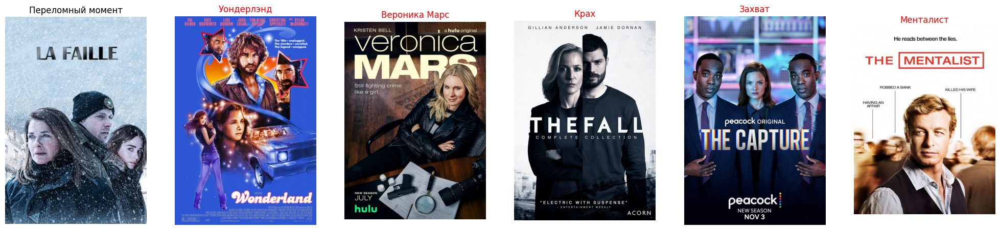

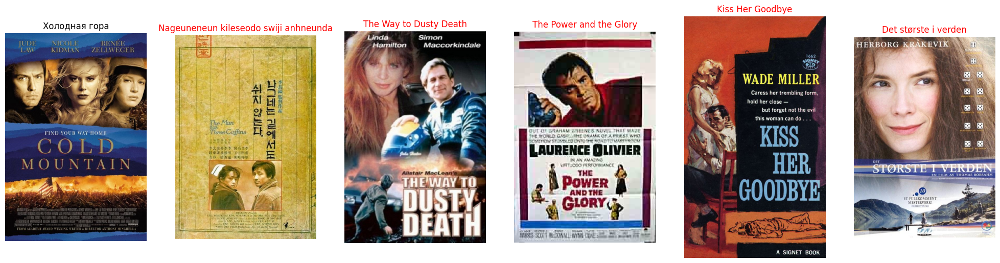

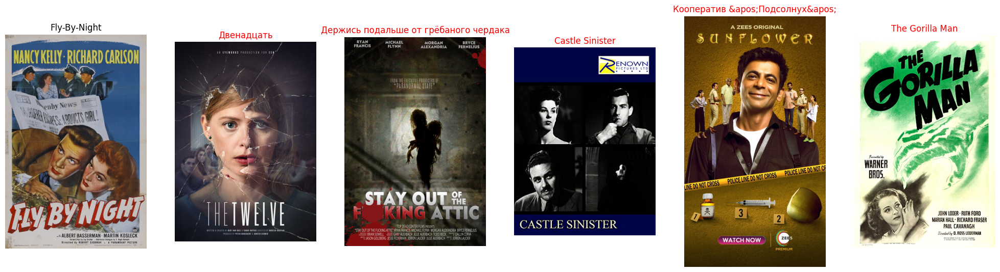

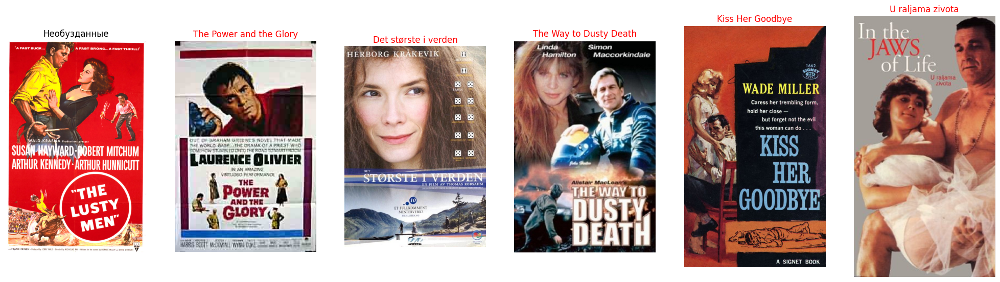

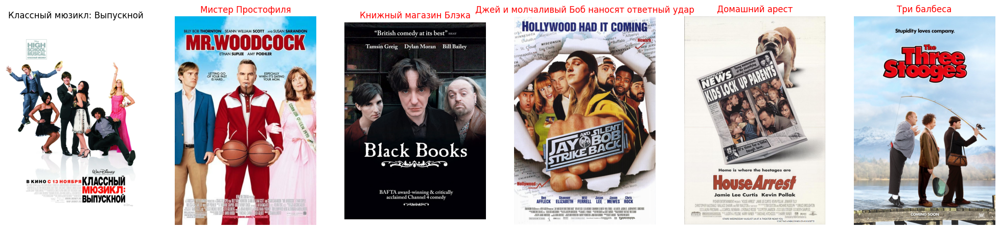

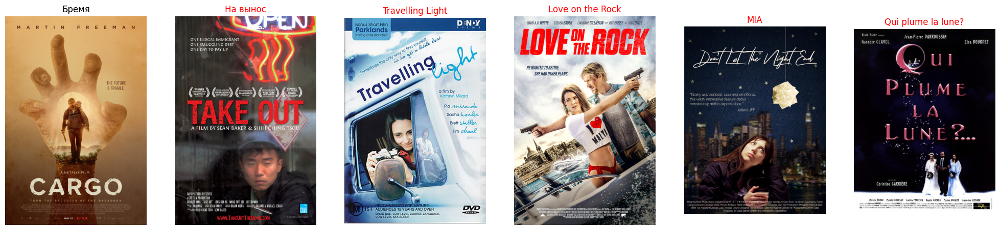

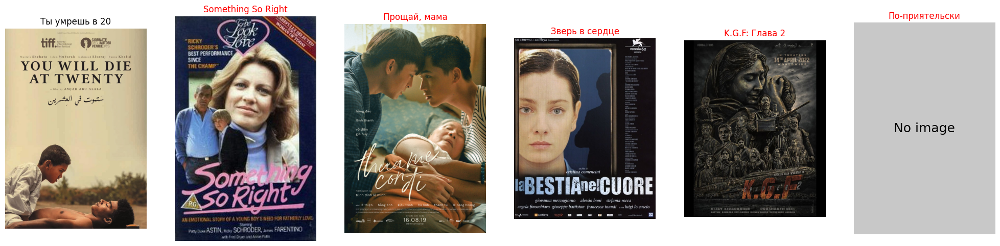

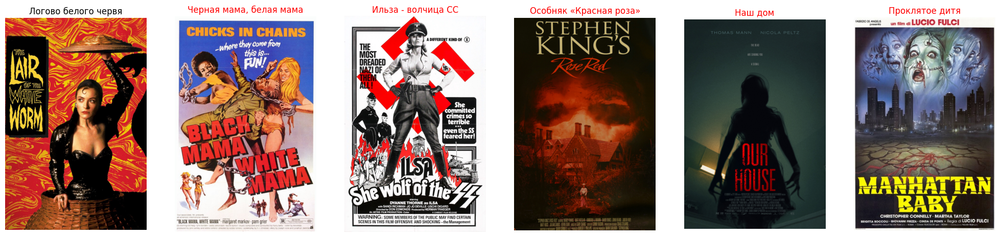

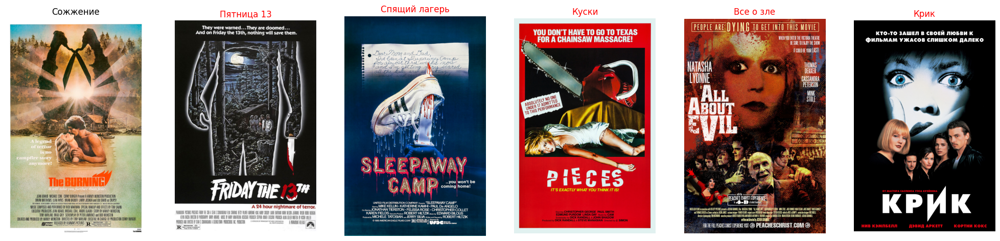

/opt/anaconda3/envs/pa/lib/python3.10/site-packages/PIL/Image.py:3186: DecompressionBombWarning: Image size (97200000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


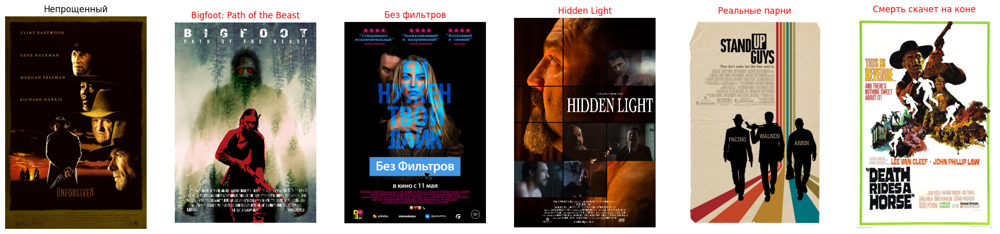

In [25]:
# Define the size of the "No image" placeholder
placeholder_size = (200, 300)  # Example size, adjust as needed

random_ids = np.random.randint(movies_df.shape[0], size=10)
random_movies = movies_df.loc[random_ids, "title_id"]

k = 5
for title_id in random_movies:
    fig, axs = plt.subplots(1, k + 1, figsize=(25, 10))

    # Find the index of the target movie
    title_ind = movies_df["title_id"].to_list().index(title_id)

    # Get the relevant titles for the target movie
    relevant_titles = (
        relevant_titles_df[relevant_titles_df["title_id"] == title_id][
            "relevant_titles"
        ]
        .explode()
        .tolist()
    )

    # Visualize the target movie
    url = movies_df.loc[title_ind, "poster_url"]
    try:
        im = Image.open(requests.get(url, stream=True).raw)
    except UnidentifiedImageError:
        im = None  # If the image is not found or can't be loaded

    if im:
        axs[0].imshow(im)
    else:
        # Create a "No image" placeholder with the same size as other images
        placeholder_img = Image.new("RGB", placeholder_size, (200, 200, 200))
        axs[0].imshow(placeholder_img)
        # Centrally align the "No image" text within the placeholder
        axs[0].text(
            0.5,
            0.5,
            "No image",
            fontsize=18,
            ha="center",
            va="center",
            color="black",
            transform=axs[
                0
            ].transAxes,  # Ensure the text is aligned relative to the axis
        )
    axs[0].axis("off")
    axs[0].set_title(movies_df["name"][title_ind])

    # Build the recommendations
    nearest_inds = I[title_ind][:k]
    recs_posters = movies_df.loc[nearest_inds, "poster_url"]
    recs_names = movies_df.loc[nearest_inds, "name"]
    recs_title_ids = movies_df.loc[nearest_inds, "title_id"].values

    # Visualize the recommendations
    for i, (url, name) in enumerate(zip(recs_posters, recs_names)):
        try:
            im = Image.open(requests.get(url, stream=True).raw)
        except UnidentifiedImageError:
            im = None  # If the image is not found or can't be loaded

        if im:
            axs[1 + i].imshow(im)
        else:
            # Use the same "No image" placeholder for missing images
            placeholder_img = Image.new("RGB", placeholder_size, (200, 200, 200))
            axs[1 + i].imshow(placeholder_img)
            axs[1 + i].text(
                0.5,
                0.5,
                "No image",
                fontsize=18,
                ha="center",
                va="center",
                color="black",
                transform=axs[
                    1 + i
                ].transAxes,  # Ensure the text is aligned relative to the axis
            )
        axs[1 + i].axis("off")
        axs[1 + i].set_title(
            name, color=("g" if recs_title_ids[i] in relevant_titles else "r")
        )

    plt.show()